In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.8/883.8 kB 23.7 MB/s eta 0:00:00


**DETEKSI PERGAMBAR**


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0004_jpg.rf.768eaf92a930b1d50cc0b722ddfa5af7.jpg: 640x640 1 mobil, 1 motor, 2227.3ms
Speed: 3.4ms preprocess, 2227.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/detect_foto_0004_jpg.rf.768eaf92a930b1d50cc0b722ddfa5af7.jpg


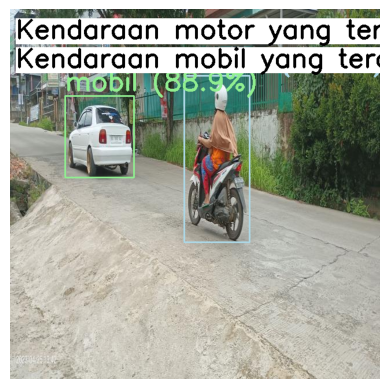

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Load the model
model = YOLO('/content/drive/MyDrive/Training YOLOv9c/100/result_data12k/kaggle/working/runs/detect/train/weights/best.pt')

# Set the path to the input image
img_path = '/content/foto_0031.jpg'
output_path = '/content/detected10.jpg'  # Path untuk menyimpan gambar

# Fungsi untuk mendeteksi objek dan menghitung jumlah tiap label
def detect_objects_and_count(img_path, output_path):
    # Lakukan deteksi objek pada gambar
    results = model(img_path)

    # Mengambil hasil deteksi (kotak dan akurasi)
    detections = results[0].boxes
    class_indices = detections.cls.cpu().numpy().astype(int)  # Ambil indeks kelas
    class_names = [model.names[i] for i in class_indices]     # Pemetaan indeks ke nama label
    confidences = detections.conf.cpu().numpy()               # Ambil confidence score

    # Hitung jumlah objek per label
    label_counts = {}
    for label in class_names:
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

    # Membaca gambar menggunakan OpenCV untuk menampilkan hasil deteksi dengan label jumlah objek
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Definisikan warna khusus untuk setiap label
    label_colors = {
        "mobil": (144, 238, 144),  # Hijau muda (Light Green)
        "motor": (173, 216, 230),  # Biru muda (Light Blue)
    }

    # Tambahkan bounding boxes dan teks jumlah objek per label
    y_offset = 50  # Mengatur jarak vertikal yang lebih jauh untuk teks (lebih besar)


    # Gambar bounding boxes dengan nama label dan confidence
    for i, box in enumerate(detections.xyxy.cpu().numpy()):  # Mendapatkan koordinat box deteksi
        x1, y1, x2, y2 = map(int, box)  # Koordinat kotak deteksi
        label = class_names[i]
        confidence = confidences[i]

        # Menggunakan warna yang sudah ditentukan untuk setiap label
        color = label_colors.get(label, (255, 255, 0))  # Default ke kuning jika label tidak ada di dict

        # Gambar kotak deteksi dengan warna yang sudah ditentukan
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, 2)

        # Tambahkan nama label dan confidence di atas bounding box dengan font yang lebih besar dan tebal
        label_text = f"{label} ({confidence*100:.1f}%)"
        cv2.putText(img_rgb, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, color, 3)

    for i, (label, count) in enumerate(label_counts.items()):
        text = f"Kendaraan {label} yang terdeteksi berjumlah {count}"

        # Menggambar latar belakang putih untuk teks
        (text_width, text_height), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 1.5, 3)
        cv2.rectangle(img_rgb, (10, y_offset - text_height), (10 + text_width, y_offset + 10), (255, 255, 255), -1)

        # Menambahkan teks dengan warna hitam di atas latar belakang putih
        cv2.putText(img_rgb, text, (10, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 0), 3)  # Teks hitam
        y_offset += 50  # Meningkatkan jarak vertikal untuk setiap label baru

    # Simpan gambar hasil deteksi dengan bounding boxes dan label
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)  # Ubah kembali ke BGR untuk menyimpan
    cv2.imwrite(output_path, img_bgr)
    print(f"Gambar disimpan di: {output_path}")

    # Tampilkan gambar hasil deteksi dengan bounding box
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# Panggil fungsi untuk menampilkan dan menyimpan hasil
detect_objects_and_count(img_path, output_path)


**DETEKSI GAMBAR DALAM FOLDER**


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0026.jpg: 768x1728 3 mobils, 2 motors, 8741.7ms
Speed: 13.9ms preprocess, 8741.7ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0026.jpg


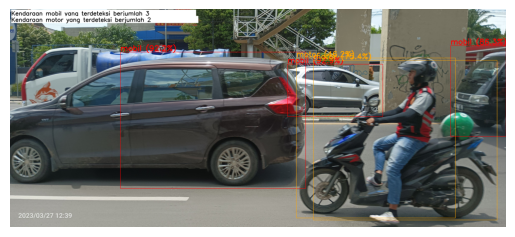


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0021.jpg: 768x1728 9 mobils, 4 motors, 7974.0ms
Speed: 13.8ms preprocess, 7974.0ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0021.jpg


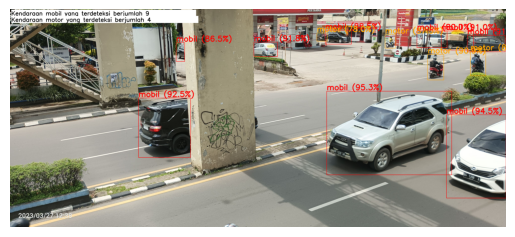


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0005.jpg: 768x1728 2 mobils, 1 motor, 6989.2ms
Speed: 24.9ms preprocess, 6989.2ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0005.jpg


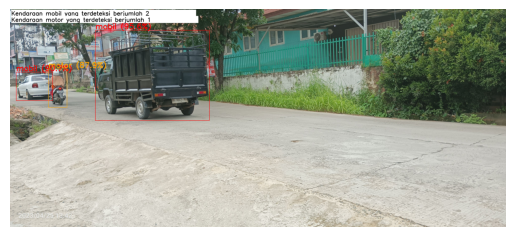


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0045.jpg: 768x1728 24 mobils, 6 motors, 8596.1ms
Speed: 14.1ms preprocess, 8596.1ms inference, 1.9ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0045.jpg


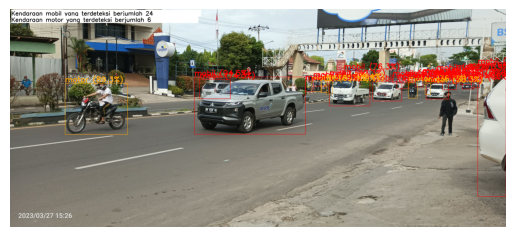


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0104.jpg: 768x1728 6 mobils, 10 motors, 7237.4ms
Speed: 13.3ms preprocess, 7237.4ms inference, 2.1ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0104.jpg


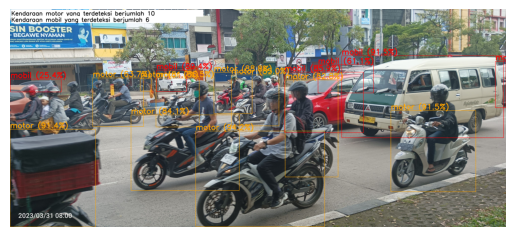


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0107.jpg: 768x1728 6 mobils, 7 motors, 7504.1ms
Speed: 23.0ms preprocess, 7504.1ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0107.jpg


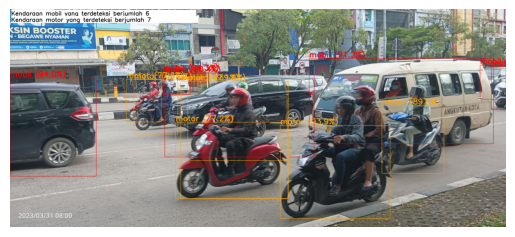


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0044.jpg: 768x1728 24 mobils, 4 motors, 8425.8ms
Speed: 13.3ms preprocess, 8425.8ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0044.jpg


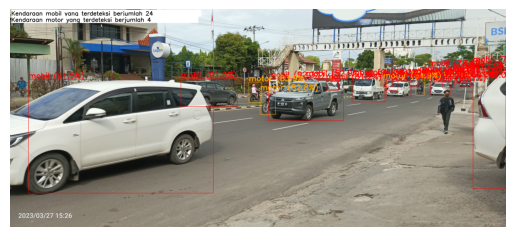


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0031.jpg: 768x1728 4 mobils, 5 motors, 6291.5ms
Speed: 15.3ms preprocess, 6291.5ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0031.jpg


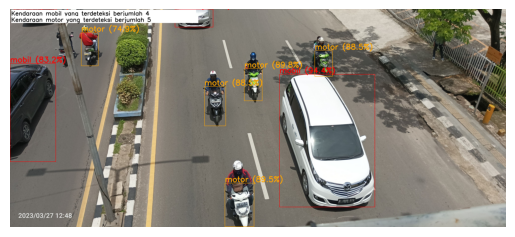


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0040.jpg: 768x1728 25 mobils, 10 motors, 7883.9ms
Speed: 22.4ms preprocess, 7883.9ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0040.jpg


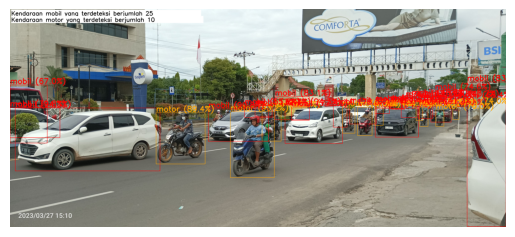


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0102.jpg: 768x1728 4 mobils, 14 motors, 6936.9ms
Speed: 13.8ms preprocess, 6936.9ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0102.jpg


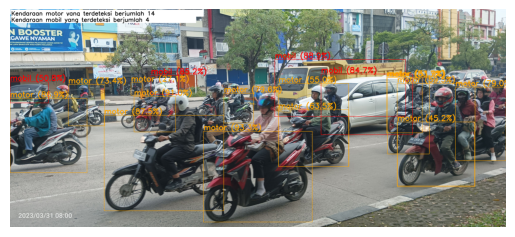


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0051.jpg: 768x1728 15 mobils, 5 motors, 6640.3ms
Speed: 23.9ms preprocess, 6640.3ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0051.jpg


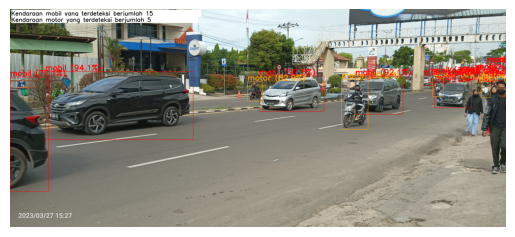


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0047.jpg: 768x1728 24 mobils, 7 motors, 7910.7ms
Speed: 22.2ms preprocess, 7910.7ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0047.jpg


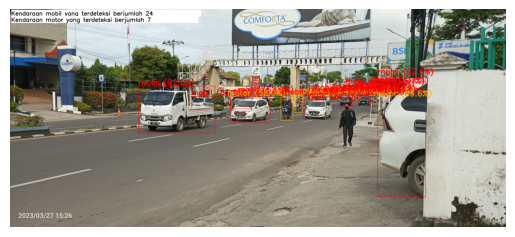


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0122.jpg: 768x1728 3 mobils, 6250.1ms
Speed: 29.1ms preprocess, 6250.1ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0122.jpg


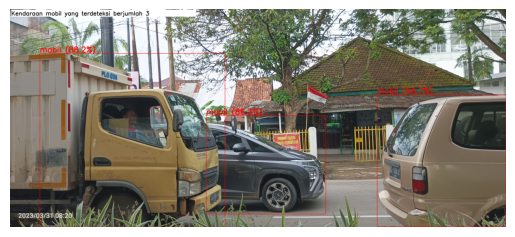


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0131.jpg: 768x1728 3 mobils, 6 motors, 7887.5ms
Speed: 24.6ms preprocess, 7887.5ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0131.jpg


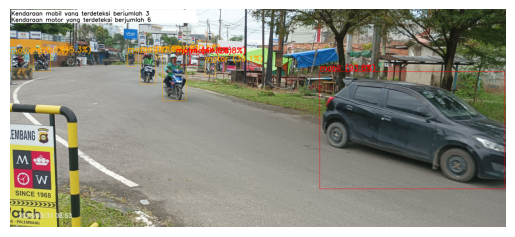


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0065.jpg: 768x1728 14 mobils, 10 motors, 6699.9ms
Speed: 31.7ms preprocess, 6699.9ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0065.jpg


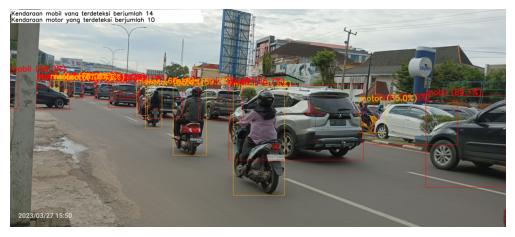


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0124.jpg: 768x1728 30 mobils, 19 motors, 7003.8ms
Speed: 27.5ms preprocess, 7003.8ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0124.jpg


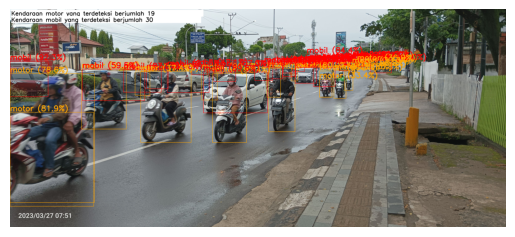


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0064.jpg: 768x1728 20 mobils, 9 motors, 7979.0ms
Speed: 28.3ms preprocess, 7979.0ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0064.jpg


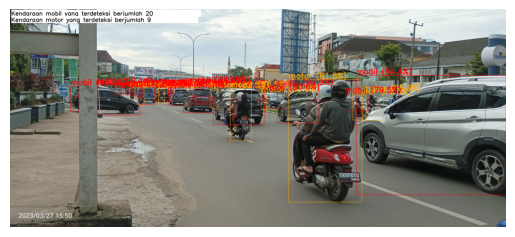


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0066.jpg: 768x1728 5 mobils, 5 motors, 6290.3ms
Speed: 21.2ms preprocess, 6290.3ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0066.jpg


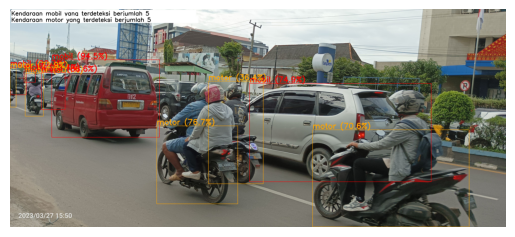


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0187.jpg: 768x1728 7 mobils, 5 motors, 7877.7ms
Speed: 21.3ms preprocess, 7877.7ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0187.jpg


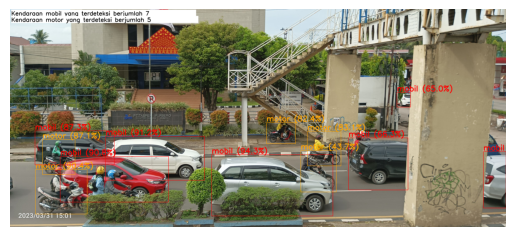


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0140.jpg: 768x1728 20 mobils, 16 motors, 6283.2ms
Speed: 21.7ms preprocess, 6283.2ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0140.jpg


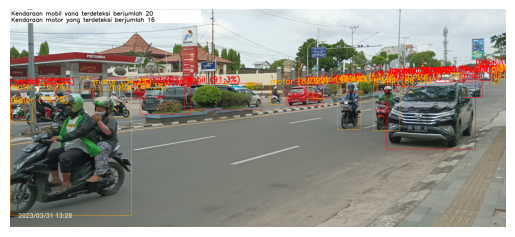


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0135.jpg: 768x1728 6 mobils, 2 motors, 7349.9ms
Speed: 43.5ms preprocess, 7349.9ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0135.jpg


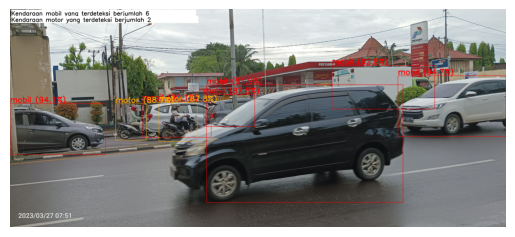


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0197.jpg: 768x1728 7 mobils, 8 motors, 7753.7ms
Speed: 24.7ms preprocess, 7753.7ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0197.jpg


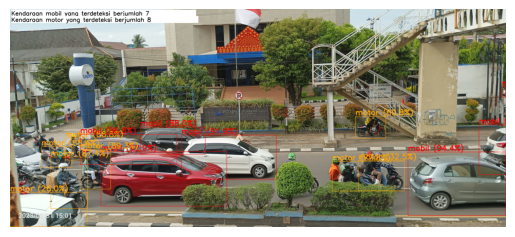


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0138.jpg: 768x1728 1 mobil, 3 motors, 6411.0ms
Speed: 20.9ms preprocess, 6411.0ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0138.jpg


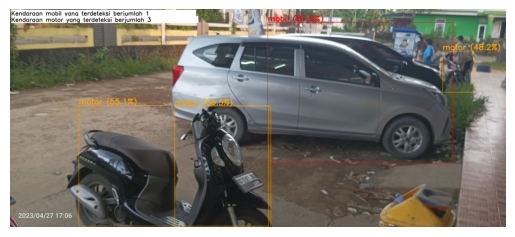


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0094.jpg: 768x1728 17 mobils, 12 motors, 7979.8ms
Speed: 20.8ms preprocess, 7979.8ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0094.jpg


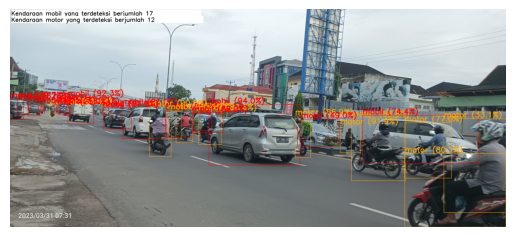


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0093.jpg: 768x1728 23 mobils, 8 motors, 7302.6ms
Speed: 21.1ms preprocess, 7302.6ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0093.jpg


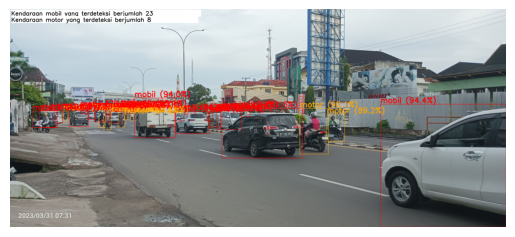


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0184.jpg: 768x1728 39 mobils, 28 motors, 6415.3ms
Speed: 20.7ms preprocess, 6415.3ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0184.jpg


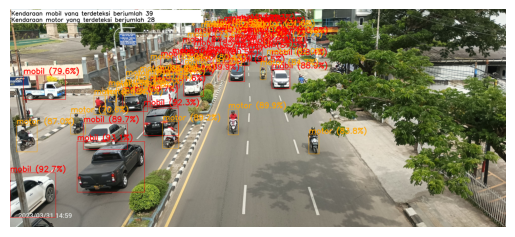


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0147.jpg: 768x1728 19 mobils, 9 motors, 7928.3ms
Speed: 20.8ms preprocess, 7928.3ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0147.jpg


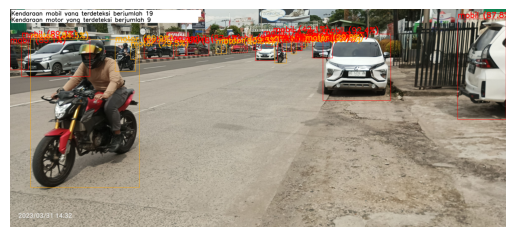


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0145.jpg: 768x1728 24 mobils, 18 motors, 7815.2ms
Speed: 22.4ms preprocess, 7815.2ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0145.jpg


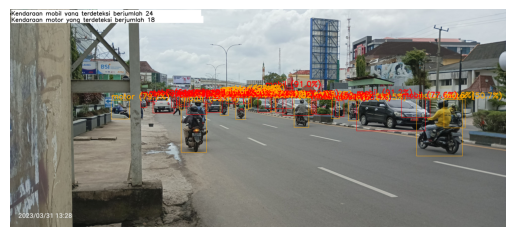


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0203.jpg: 768x1728 5 mobils, 6352.8ms
Speed: 21.2ms preprocess, 6352.8ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0203.jpg


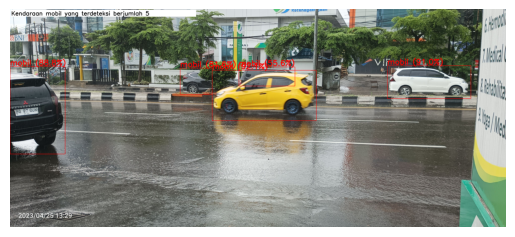


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0171.jpg: 768x1728 20 mobils, 3 motors, 7684.5ms
Speed: 31.5ms preprocess, 7684.5ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0171.jpg


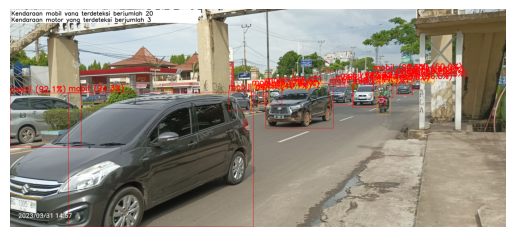


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0206.jpg: 768x1728 3 mobils, 2 motors, 8025.9ms
Speed: 21.7ms preprocess, 8025.9ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0206.jpg


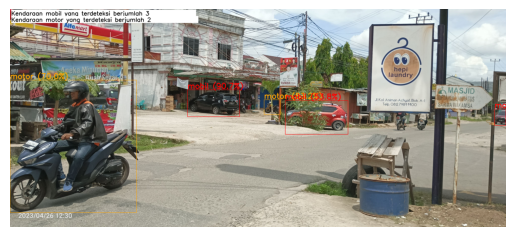


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0173.jpg: 768x1728 14 mobils, 2 motors, 6317.4ms
Speed: 21.3ms preprocess, 6317.4ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0173.jpg


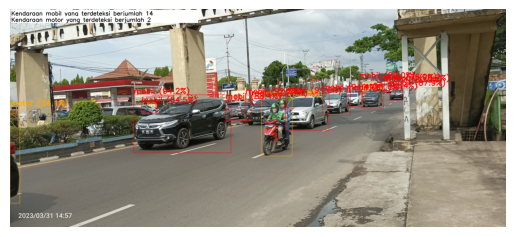


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0174.jpg: 768x1728 14 mobils, 2 motors, 6885.2ms
Speed: 24.1ms preprocess, 6885.2ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0174.jpg


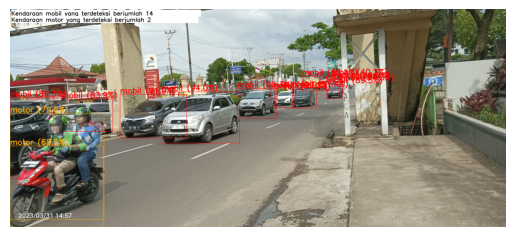


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0226.jpg: 768x1728 3 mobils, 5 motors, 8026.0ms
Speed: 21.4ms preprocess, 8026.0ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0226.jpg


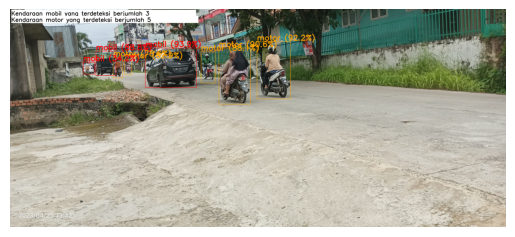


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0189.jpg: 768x1728 15 mobils, 6 motors, 6490.8ms
Speed: 21.3ms preprocess, 6490.8ms inference, 1.9ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0189.jpg


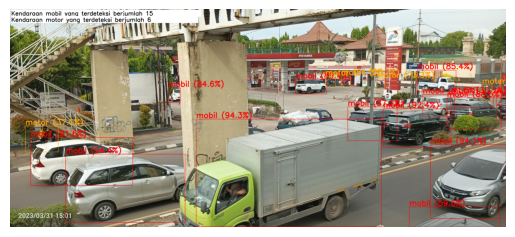


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0227.jpg: 768x1728 2 mobils, 4 motors, 6600.5ms
Speed: 20.4ms preprocess, 6600.5ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0227.jpg


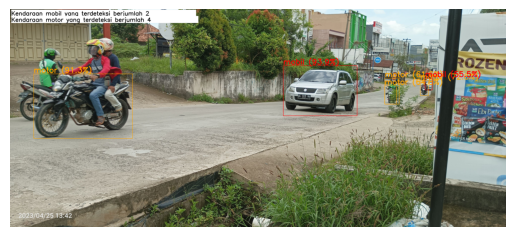


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0218.jpg: 768x1728 1 mobil, 1 motor, 8045.8ms
Speed: 25.1ms preprocess, 8045.8ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0218.jpg


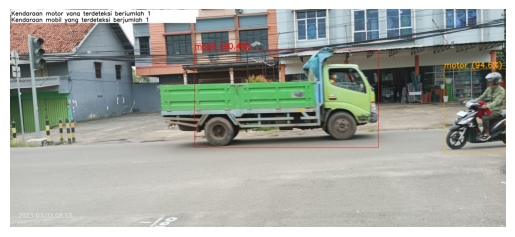


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0205.jpg: 768x1728 16 mobils, 7 motors, 6884.9ms
Speed: 21.4ms preprocess, 6884.9ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0205.jpg


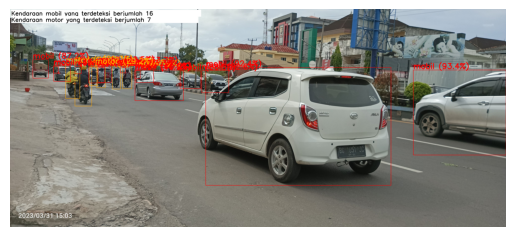


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0194.jpg: 768x1728 2 mobils, 6488.4ms
Speed: 31.4ms preprocess, 6488.4ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0194.jpg


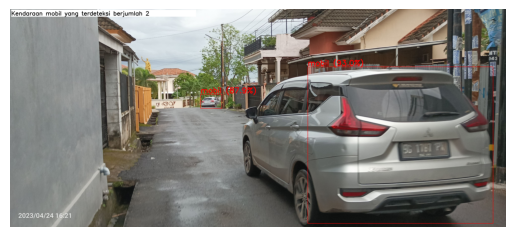


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0192.jpg: 768x1728 4 mobils, 8015.9ms
Speed: 21.4ms preprocess, 8015.9ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0192.jpg


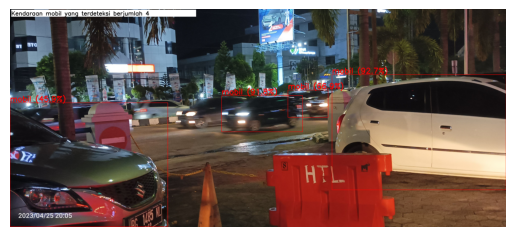


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0261.jpg: 768x1728 2 mobils, 1 motor, 6933.5ms
Speed: 27.9ms preprocess, 6933.5ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0261.jpg


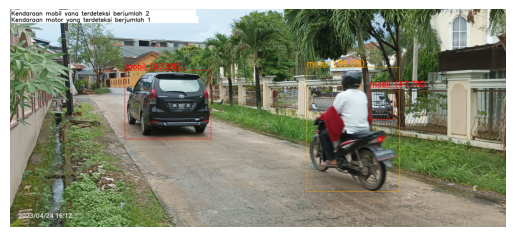


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0244.jpg: 768x1728 4 mobils, 7 motors, 6356.9ms
Speed: 21.3ms preprocess, 6356.9ms inference, 1.2ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0244.jpg


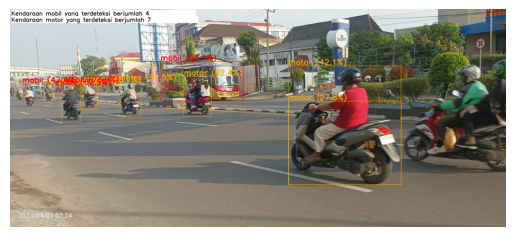


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0223.jpg: 768x1728 4 mobils, 6 motors, 8103.8ms
Speed: 21.2ms preprocess, 8103.8ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0223.jpg


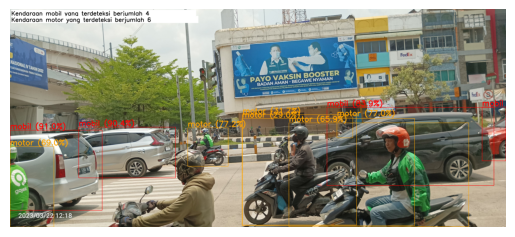


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0224.jpg: 768x1728 4 mobils, 6 motors, 7432.7ms
Speed: 20.2ms preprocess, 7432.7ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0224.jpg


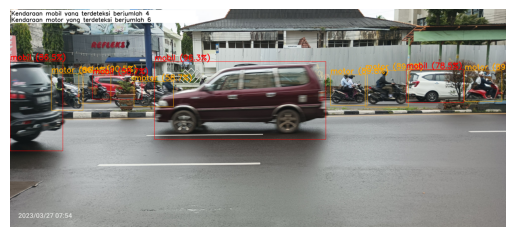


WARNING ⚠️ imgsz=[4160, 3120] must be multiple of max stride 32, updating to [4160, 3136]
image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_1152.jpg: 2368x3136 10 mobils, 27 motors, 53265.0ms
Speed: 99.6ms preprocess, 53265.0ms inference, 4.0ms postprocess per image at shape (1, 3, 2368, 3136)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_1152.jpg


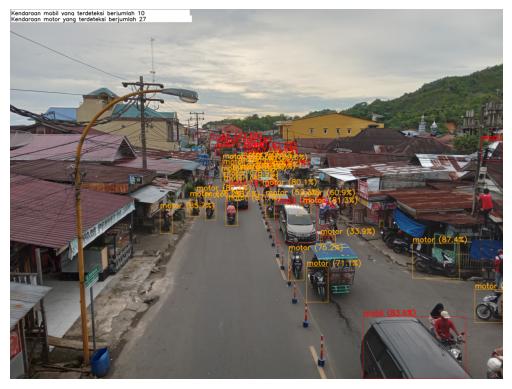


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0238.jpg: 768x1728 7 mobils, 8 motors, 7102.1ms
Speed: 27.9ms preprocess, 7102.1ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0238.jpg


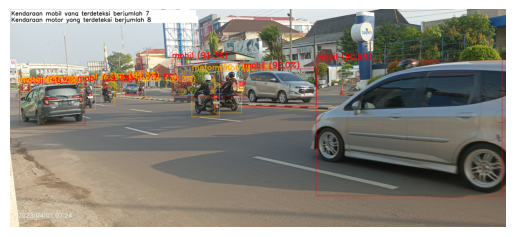


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0241.jpg: 768x1728 5 mobils, 9 motors, 8074.2ms
Speed: 21.2ms preprocess, 8074.2ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0241.jpg


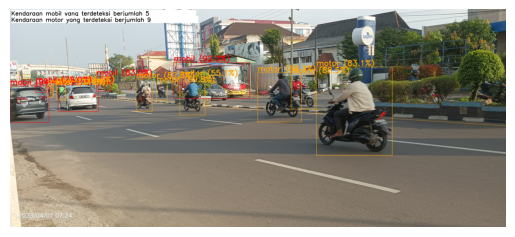


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0245.jpg: 768x1728 7 mobils, 11 motors, 6733.9ms
Speed: 20.9ms preprocess, 6733.9ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0245.jpg


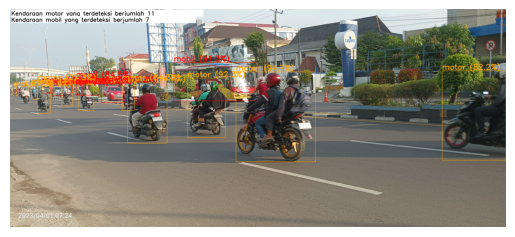


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0256.jpg: 768x1728 4 mobils, 13 motors, 6712.6ms
Speed: 35.1ms preprocess, 6712.6ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0256.jpg


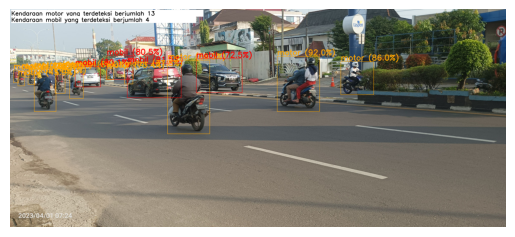


image 1/1 /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi/foto_0258.jpg: 768x1728 14 mobils, 36 motors, 8114.6ms
Speed: 21.8ms preprocess, 8114.6ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1728)
Gambar disimpan di: /content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4/detected_foto_0258.jpg


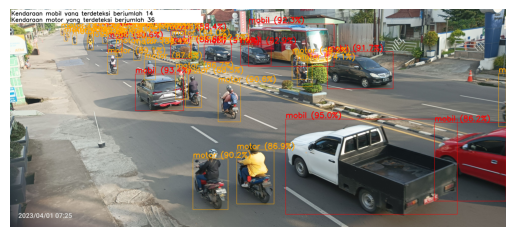

In [ ]:
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Load the model
model = YOLO('/content/drive/MyDrive/Training YOLOv9c/100/result_data12k/kaggle/working/runs/detect/train/weights/best.pt')

# Path folder input dan output
input_folder = '/content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi'
output_folder = '/content/drive/MyDrive/Deteksi Kendaraan Images/perbandingan_deteksi_output4'  # Folder untuk menyimpan hasil

# Pastikan folder output ada, jika tidak, buat folder baru
os.makedirs(output_folder, exist_ok=True)

# Fungsi untuk mendeteksi objek dan menghitung jumlah tiap label
def detect_objects_and_count(img_path, output_path):
    # Membaca gambar menggunakan OpenCV untuk mendapatkan dimensi asli
    img = cv2.imread(img_path)
    original_height, original_width = img.shape[:2]

    # Lakukan deteksi objek pada gambar dengan ukuran input sesuai gambar asli
    results = model(img_path, imgsz=(original_width, original_height))

    # Mengambil hasil deteksi (kotak dan akurasi)
    detections = results[0].boxes
    class_indices = detections.cls.cpu().numpy().astype(int)  # Ambil indeks kelas
    class_names = [model.names[i] for i in class_indices]     # Pemetaan indeks ke nama label
    confidences = detections.conf.cpu().numpy()               # Ambil confidence score

    # Hitung jumlah objek per label
    label_counts = {}
    for label in class_names:
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1

    # Mengubah gambar ke format RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Definisikan warna khusus untuk setiap label
    label_colors = {
        "mobil": (255, 0, 0),  # Merah
        "motor": (255, 165, 0),  # Oranye
    }


    # Tambahkan bounding boxes dan teks jumlah objek per label
    y_offset = 50  # Mengatur jarak vertikal yang lebih jauh untuk teks (lebih besar)

    # Gambar bounding boxes dengan nama label dan confidence
    for i, box in enumerate(detections.xyxy.cpu().numpy()):  # Mendapatkan koordinat box deteksi
        x1, y1, x2, y2 = map(int, box)  # Koordinat kotak deteksi
        label = class_names[i]
        confidence = confidences[i]

        # Menggunakan warna yang sudah ditentukan untuk setiap label
        color = label_colors.get(label, (255, 255, 0))  # Default ke kuning jika label tidak ada di dict

        # Gambar kotak deteksi dengan warna yang sudah ditentukan
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, 2)

        # Tambahkan nama label dan confidence di atas bounding box dengan font yang lebih besar dan tebal
        label_text = f"{label} ({confidence*100:.1f}%)"
        cv2.putText(img_rgb, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, color, 6)

    for i, (label, count) in enumerate(label_counts.items()):
        text = f"Kendaraan {label} yang terdeteksi berjumlah {count}"

        # Menggambar latar belakang putih untuk teks
        (text_width, text_height), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 2, 6)
        cv2.rectangle(img_rgb, (10, y_offset - text_height), (10 + text_width, y_offset + 10), (255, 255, 255), -1)

        # Menambahkan teks dengan warna hitam di atas latar belakang putih
        cv2.putText(img_rgb, text, (10, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 0), 3)  # Teks hitam
        y_offset += 50  # Meningkatkan jarak vertikal untuk setiap label baru

    # Simpan gambar hasil deteksi dengan bounding boxes dan label
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)  # Ubah kembali ke BGR untuk menyimpan
    cv2.imwrite(output_path, img_bgr)
    print(f"Gambar disimpan di: {output_path}")

    # Tampilkan gambar hasil deteksi dengan bounding box
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# Iterasi melalui semua gambar di folder input
for filename in os.listdir(input_folder):
    img_path = os.path.join(input_folder, filename)

    # Cek apakah file adalah gambar (misalnya JPG, PNG)
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        output_path = os.path.join(output_folder, f"detected_{filename}")
        detect_objects_and_count(img_path, output_path)
